## Link Prediction
**Link Prediction** (предсказание связей) - это задача в области графовых знаний, направленная на предсказание отношений (рёбер) между сущностями в графовой структуре. В контексте баз данных знаний, где информация представлена в виде графа, задача link prediction становится важным инструментом для дополнения или обновления существующей сети отношений.

Задача link prediction заключается в предсказании отсутствующих рёбер между сущностями, основываясь на известных связях в графе.

Применения link prediction включают:

> Предсказание новых связей между пользователями или группами.

> Предсказание взаимодействий между белками в биологических сетях.

> Предсказание связей между пользователями и товарами.

> Пополнение базы знаний новыми фактами.

В контексте машинного обучения и графовых моделей, задача link prediction решается с использованием методов, таких как графовые эмбеддинги, глубокие нейронные сети, и другие алгоритмы, специфичные для графовых данных.

### Установка зависимостей


Устанавливаем необходимые для работы зависимости

In [ ]:
!pip install pykeen matplotlib

Далее, импортируем необходимых модулей

In [37]:
import pykeen
import torch
import matplotlib.pyplot as plt
from pykeen.pipeline import pipeline
from pykeen.evaluation import ClassificationEvaluator
from pykeen.datasets import Kinships

В этой работе мы снова будем использовать уже известный dataset Kinships

In [38]:
# Загрузка графового датасета Kinships
kinships_dataset = Kinships()

Проверяем доступность GPU для вычислений

In [39]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


## Метрики для оценки работы модели

В рамках этой работы мы рассмотрим несколько classification метрик.

#### **ROC-AUC Score (Receiver Operating Characteristic - Площадь под кривой):**

> **ROC-AUC** - это метрика, используемая для оценки производительности бинарной классификационной модели.

> Измеряет площадь под кривой ROC, которая отображает соотношение верно положительных случаев к ложно положительным случаям при различных значениях порога.

> Более высокий показатель ROC-AUC указывает на лучшую дискриминацию между положительными и отрицательными случаями.

#### **Precision:**

> **Precision** - это метрика, оценивающая точность положительных предсказаний классификационной модели.

> Рассчитывается как отношение верно положительных предсказаний к общему числу положительных предсказаний (верно положительные + ложно положительные).

> Precision особенно важна, когда стоимость ложно положительных случаев высока.

#### **Accuracy:**

>  **Accuracy** - простая метрика, измеряющая общую правильность классификационной модели.

> Рассчитывается как отношение правильно предсказанных случаев (верно положительные + верно отрицательные) к общему числу случаев.

> В то время как Accuracy легко интерпретировать, она может быть несостоятельной для несбалансированных наборов данных, где один класс значительно превосходит другой.

#### **F1-мера (F1 Score):**

> **F1-мера** - это гармоническое среднее точности и полноты.

> Обеспечивает баланс между точностью и полнотой, что делает ее подходящей метрикой для несбалансированных наборов данных.

Эти метрики часто используются для оценки моделей, и их выбор зависит от конкретных целей и характеристик решаемой проблемы. Например, в сценариях, где ложно положительные или ложно отрицательные случаи имеют разные стоимости, могут быть более актуальными точность или полнота. ROC-AUC обеспечивает всесторонний обзор способности модели к дискриминации между классами при различных значениях порога.

In [40]:
#Объявим переменные для хранения рассчитанных метрик
roc_auc_score = []
precision = []
accuracy = []
f1 = []

#Переменная для хранения рразличных пайплайнов pykeen
pipeline_results_list = []

 Чтобы ценить работу модели на наборе данных будем использовать ClassificationEvaluator() позволяющий рассчитывать рассмотренные ранее метрики

In [41]:
evaluator = ClassificationEvaluator()

Обучим модель ComplEx для разного количества эпох, для каждой модели рассчитаем и сохраним значения метрик

In [42]:
# Список значений количества эпох
epochs = [1,20,50,100,250]

for epoch in epochs:

  # Обучаем модель
  pipeline_results = pipeline(
      model="ComplEx",
      dataset=kinships_dataset,
      training_kwargs=dict(num_epochs=epoch),
      device=device
  )

  # Сохраняем обученную модель
  pipeline_results_list.append(pipeline_results)

  model = pipeline_results.model
  # Рассчитываем метрики для обученной модели и датасета Kinships
  metrics = evaluator.evaluate(model, kinships_dataset.testing.mapped_triples,
                             additional_filter_triples=[kinships_dataset.training.mapped_triples,
                                                        kinships_dataset.validation.mapped_triples])

  # Сохраняем рассчитанные метрики
  roc_auc_score.append(metrics.get_metric('roc_auc_score'))
  precision.append(metrics.get_metric('average_precision_score'))
  accuracy.append(metrics.get_metric('accuracy_score'))
  f1.append(metrics.get_metric('f1_score'))

INFO:pykeen.pipeline.api:Using device: cpu


Training epochs on cpu:   0%|          | 0/1 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.41s seconds
INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

/usr/local/lib/python3.10/dist-packages/rexmex/metrics/classification.py:484: RuntimeWarning: invalid value encountered in power
  pthr = (fpr**0.5) / (fpr**0.5 + tpr**0.5)
INFO:pykeen.evaluation.evaluator:Evaluation took 0.86s seconds
INFO:pykeen.pipeline.api:Using device: cpu


Training epochs on cpu:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.33s seconds
INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

/usr/local/lib/python3.10/dist-packages/rexmex/metrics/classification.py:484: RuntimeWarning: invalid value encountered in power
  pthr = (fpr**0.5) / (fpr**0.5 + tpr**0.5)
INFO:pykeen.evaluation.evaluator:Evaluation took 0.80s seconds
INFO:pykeen.pipeline.api:Using device: cpu


Training epochs on cpu:   0%|          | 0/50 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.32s seconds
INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

/usr/local/lib/python3.10/dist-packages/rexmex/metrics/classification.py:484: RuntimeWarning: invalid value encountered in power
  pthr = (fpr**0.5) / (fpr**0.5 + tpr**0.5)
INFO:pykeen.evaluation.evaluator:Evaluation took 0.81s seconds
INFO:pykeen.pipeline.api:Using device: cpu


Training epochs on cpu:   0%|          | 0/100 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.36s seconds
INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

/usr/local/lib/python3.10/dist-packages/rexmex/metrics/classification.py:484: RuntimeWarning: invalid value encountered in power
  pthr = (fpr**0.5) / (fpr**0.5 + tpr**0.5)
INFO:pykeen.evaluation.evaluator:Evaluation took 0.84s seconds
INFO:pykeen.pipeline.api:Using device: cpu


Training epochs on cpu:   0%|          | 0/250 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.39s seconds
INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

/usr/local/lib/python3.10/dist-packages/rexmex/metrics/classification.py:484: RuntimeWarning: invalid value encountered in power
  pthr = (fpr**0.5) / (fpr**0.5 + tpr**0.5)
INFO:pykeen.evaluation.evaluator:Evaluation took 0.90s seconds


После того как метрики рассчитаны для разного количества эпох обучения визуализируем полученные метрики

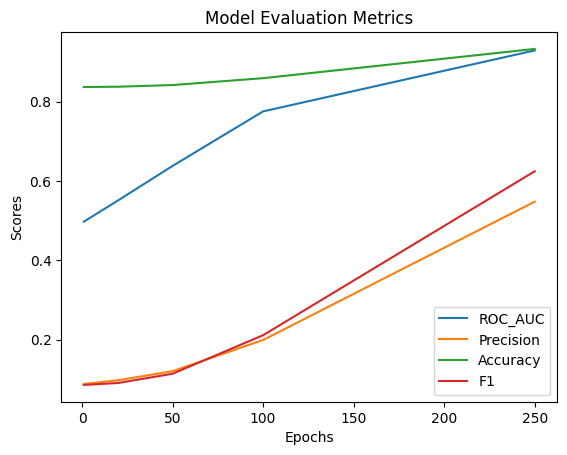

In [43]:
# В качесте лейблов используем список значений эпох
labels = epochs

# Plotting ROC AUC scores
plt.plot(labels, roc_auc_score, label='ROC_AUC')

# Plotting precision scores
plt.plot(labels, precision, label='Precision')

# Plotting accuracy scores
plt.plot(labels, accuracy, label='Accuracy')

# Plotting F1
plt.plot(labels, f1, label='F1')

# Добавляем легенду, лейблы и название
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Scores')
plt.title('Model Evaluation Metrics')

# Отрисовываем график
plt.show()


Далее рассмотрим  метод predict_target(). Основной вариант использования pykeen.predict.predict_target() — прогнозирование ссылок или прогнозирование отношений.

In [46]:
from pykeen.predict import predict_target

for idx, ep in enumerate(epochs):
    pipeline_result = pipeline_results_list[idx]

    # Получаем доступное отношение и сущность
    available_relation = next(iter(kinships_dataset.relation_to_id))
    available_entity = next(iter(kinships_dataset.entity_to_id))

    # Используем predict_target с доступным отношением и сущностью
    pred = predict_target(
        model=pipeline_result.model,
        relation=available_relation,
        head=available_entity,
        triples_factory=pipeline_result.training,
    )

    pred_filtered = pred.filter_triples(kinships_dataset.training)
    pred_annotated = pred_filtered.add_membership_columns(validation=kinships_dataset.validation, testing=kinships_dataset.testing)
    pred_df = pred_annotated.df[['tail_label', 'score']]
    print(f'Результат при вычислении {ep} эпох')
    print(pred_df)
    print('__________________________')


Результат при вычислении 1 эпох
    tail_label      score
42    person43  91.098328
14    person18  76.474167
8     person12  63.329777
102   person98  62.656620
19    person22  58.054886
..         ...        ...
9     person13 -38.860374
25    person28 -48.893044
97    person93 -54.536880
13    person17 -63.087273
81    person79 -68.426178

[103 rows x 2 columns]
__________________________
Результат при вычислении 20 эпох
    tail_label      score
84    person81  53.720501
14    person18  53.127449
90    person87  46.274567
16     person2  42.241543
73    person71  39.881401
..         ...        ...
21    person24 -51.461754
35    person37 -52.188778
30    person32 -57.359146
101   person97 -71.569427
56    person56 -80.298401

[103 rows x 2 columns]
__________________________
Результат при вычислении 50 эпох
   tail_label      score
0     person0  64.449059
50   person50  46.168720
78   person76  43.138153
77   person75  41.320324
21   person24  36.389748
..        ...        ...
3

Попробуйте обучыить другую модель. Примените обученную модель к другому датасету. Проанализируйте результаты. Хорошим вариантом будет преднамеренно удалить существующую связку и исследовать работу модели на предсказании удаленной связи.

# TransE

In [50]:
import pykeen
import torch
import matplotlib.pyplot as plt
from pykeen.pipeline import pipeline
from pykeen.evaluation import ClassificationEvaluator
from pykeen.datasets import Kinships
from pykeen.models import TransE

# Загрузка графового датасета Kinships
Kinships_dataset = Kinships()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Объявим переменные для хранения рассчитанных метрик
roc_auc_score = []
precision = []
accuracy = []
f1 = []

# Переменная для хранения различных пайплайнов pykeen
pipeline_results_list = []
evaluator = ClassificationEvaluator()

# Список значений количества эпох
epochs = [1, 20, 50, 100, 250]

for epoch in epochs:
    # Обучаем модель TransE
    pipeline_results = pipeline(
        model=TransE,
        dataset=Kinships_dataset,
        training_kwargs=dict(num_epochs=epoch),
        device=device
    )

    # Сохраняем обученную модель
    pipeline_results_list.append(pipeline_results)

    model = pipeline_results.model
    # Рассчитываем метрики для обученной модели и датасета Kinships
    metrics = evaluator.evaluate(model, Kinships_dataset.testing.mapped_triples,
                                 additional_filter_triples=[Kinships_dataset.training.mapped_triples,
                                                            Kinships_dataset.validation.mapped_triples])

    # Сохраняем рассчитанные метрики
    roc_auc_score.append(metrics.get_metric('roc_auc_score'))
    precision.append(metrics.get_metric('average_precision_score'))
    accuracy.append(metrics.get_metric('accuracy_score'))
    f1.append(metrics.get_metric('f1_score'))



INFO:pykeen.pipeline.api:Using device: cpu


Using device: cpu


Training epochs on cpu:   0%|          | 0/1 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.40s seconds
INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

/usr/local/lib/python3.10/dist-packages/rexmex/metrics/classification.py:484: RuntimeWarning: invalid value encountered in power
  pthr = (fpr**0.5) / (fpr**0.5 + tpr**0.5)
/usr/local/lib/python3.10/dist-packages/rexmex/metrics/classification.py:547: RuntimeWarning: invalid value encountered in power
  fm = (ppv * tpr) ** 0.5
INFO:pykeen.evaluation.evaluator:Evaluation took 0.87s seconds
INFO:pykeen.pipeline.api:Using device: cpu


Training epochs on cpu:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.37s seconds
INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

/usr/local/lib/python3.10/dist-packages/rexmex/metrics/classification.py:484: RuntimeWarning: invalid value encountered in power
  pthr = (fpr**0.5) / (fpr**0.5 + tpr**0.5)
/usr/local/lib/python3.10/dist-packages/rexmex/metrics/classification.py:547: RuntimeWarning: invalid value encountered in power
  fm = (ppv * tpr) ** 0.5
INFO:pykeen.evaluation.evaluator:Evaluation took 0.92s seconds
INFO:pykeen.pipeline.api:Using device: cpu


Training epochs on cpu:   0%|          | 0/50 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.39s seconds
INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

/usr/local/lib/python3.10/dist-packages/rexmex/metrics/classification.py:484: RuntimeWarning: invalid value encountered in power
  pthr = (fpr**0.5) / (fpr**0.5 + tpr**0.5)
/usr/local/lib/python3.10/dist-packages/rexmex/metrics/classification.py:547: RuntimeWarning: invalid value encountered in power
  fm = (ppv * tpr) ** 0.5
INFO:pykeen.evaluation.evaluator:Evaluation took 0.91s seconds
INFO:pykeen.pipeline.api:Using device: cpu


Training epochs on cpu:   0%|          | 0/100 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.41s seconds
INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

/usr/local/lib/python3.10/dist-packages/rexmex/metrics/classification.py:484: RuntimeWarning: invalid value encountered in power
  pthr = (fpr**0.5) / (fpr**0.5 + tpr**0.5)
/usr/local/lib/python3.10/dist-packages/rexmex/metrics/classification.py:547: RuntimeWarning: invalid value encountered in power
  fm = (ppv * tpr) ** 0.5
INFO:pykeen.evaluation.evaluator:Evaluation took 0.94s seconds
INFO:pykeen.pipeline.api:Using device: cpu


Training epochs on cpu:   0%|          | 0/250 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0/34 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.47s seconds
INFO:pykeen.evaluation.evaluator:Currently automatic memory optimization only supports GPUs, but you're using a CPU. Therefore, the batch_size will be set to the default value.
INFO:pykeen.evaluation.evaluator:No evaluation batch_size provided. Setting batch_size to '32'.


Evaluating on cpu:   0%|          | 0.00/1.07k [00:00<?, ?triple/s]

/usr/local/lib/python3.10/dist-packages/rexmex/metrics/classification.py:484: RuntimeWarning: invalid value encountered in power
  pthr = (fpr**0.5) / (fpr**0.5 + tpr**0.5)
/usr/local/lib/python3.10/dist-packages/rexmex/metrics/classification.py:547: RuntimeWarning: invalid value encountered in power
  fm = (ppv * tpr) ** 0.5
INFO:pykeen.evaluation.evaluator:Evaluation took 1.00s seconds


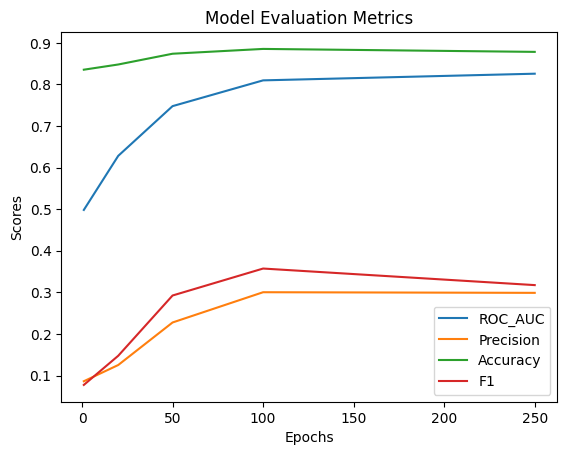

In [51]:
# В качестве лейблов используем список значений эпох
labels = epochs

# Plotting ROC AUC scores
plt.plot(labels, roc_auc_score, label='ROC_AUC')

# Plotting precision scores
plt.plot(labels, precision, label='Precision')

# Plotting accuracy scores
plt.plot(labels, accuracy, label='Accuracy')

# Plotting F1
plt.plot(labels, f1, label='F1')

# Добавляем легенду, лейблы и название
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Scores')
plt.title('Model Evaluation Metrics')

# Отрисовываем график
plt.show()




In [52]:
from pykeen.predict import predict_target

for idx, ep in enumerate(epochs):
    pipeline_result = pipeline_results_list[idx]

    # Получаем доступное отношение и сущность
    available_relation = next(iter(kinships_dataset.relation_to_id))
    available_entity = next(iter(kinships_dataset.entity_to_id))

    # Используем predict_target с доступным отношением и сущностью
    pred = predict_target(
        model=pipeline_result.model,
        relation=available_relation,
        head=available_entity,
        triples_factory=pipeline_result.training,
    )

    pred_filtered = pred.filter_triples(kinships_dataset.training)
    pred_annotated = pred_filtered.add_membership_columns(validation=kinships_dataset.validation, testing=kinships_dataset.testing)
    pred_df = pred_annotated.df[['tail_label', 'score']]
    print(f'Результат при вычислении {ep} эпох')
    print(pred_df)
    print('__________________________')

Результат при вычислении 1 эпох
   tail_label      score
0     person0  -6.248703
89   person86  -8.055448
60    person6  -8.151905
58   person58  -8.224814
16    person2  -8.247172
..        ...        ...
6   person103 -11.788224
1     person1 -11.983124
99   person95 -12.035925
9    person13 -12.072248
98   person94 -12.238372

[103 rows x 2 columns]
__________________________
Результат при вычислении 20 эпох
    tail_label      score
0      person0  -6.925099
60     person6  -8.382827
51    person51  -8.876486
20    person23  -8.890251
76    person74  -8.999991
..         ...        ...
100   person96 -11.693812
74    person72 -11.751221
29    person31 -11.986991
69    person68 -12.213017
24    person27 -12.321600

[103 rows x 2 columns]
__________________________
Результат при вычислении 50 эпох
    tail_label      score
0      person0  -6.729554
35    person37  -8.396763
52    person52  -8.459858
49     person5  -8.695475
2     person10  -8.716943
..         ...        ...
22    